In [1]:
import episcanpy.api as epi
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

/Users/anna.danese/anaconda3/envs/new_snapatac/lib/python3.6/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/Users/anna.danese/anaconda3/envs/new_snapatac/lib/python3.6/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


In [2]:
# figure settings
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map=None, format='pdf', transparent=False,
                     ipython_format='png2x')

# Load enhancers mCG methylation

In [3]:
DATADIR =''
OUT_DATADIR = './paper_data_methylation_episcanpy/'

In [4]:
#adata = basic.readandimputematrix(DATADIR+'enhancer_c1_CG_paper.txt', min_coverage=500)

In [6]:
#load the data without imputation
adata = epi.pp.load_met_noimput(DATADIR+'enhancer_c1_CG_paper.txt')
adata.write(OUT_DATADIR+'enhancer_c1_CG_paper.h5ad')

In [87]:
adata = ad.read(OUT_DATADIR+'enhancer_c1_CG_paper.h5ad')

In [88]:
adata

AnnData object with n_obs × n_vars = 3379 × 55017 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary'
    uns: 'Estimated mCG', 'Estimated mCH', 'mCCC', 'mCG', 'mCH', 'omic'

### QC plots

In [49]:
# adding QC values
length1 = len(adata.X[0,:])
length2 = len(adata.X[:,0])
adata.obs['coverage_cells'] = [length1 - np.isnan(line).sum() for line in adata.X]
adata.obs['mean_cell_methylation'] = [np.nansum(line)/length1 for line in adata.X]
adata.var['coverage_feature'] = [length2 - np.isnan(line).sum() for line in adata.X.T]
adata.var['mean_feature_methylation'] = [np.nansum(line)/length2 for line in adata.X.T]

In [43]:
adata.obs

,cell_type,Library pool,Index i5,Index i7,i5 sequence,i7 sequence,random primer index,random primer index sequence,Total reads,Mapped reads,...,mCCC/CCC,mCG/CG,mCH/CH,Estimated mCG/CG,Estimated mCH/CH,Neuron type,tSNE x coordinate,tSNE y coordinate\n,binary,coverage_cells
index,,,,,,,,,,,,,,,,,,,,,
allc_Pool_1000_AD002_indexed_qual30.tsv,mL5-1,K1K2,D508,D711,GTACTGAC,TCTCGCGC,AD002,CGATGT,3749296,1970400,...,278,1388,1138,148,1022,mL5-1,"-2,79539","-0,105851\n",inhibitory,21715
allc_nuclei_600_S147_L006_qual30.tsv,mL5-1,N/A,D508,D712,GTACTGAC,AGCGATAG,AD012,CTTGTA,7069454,4358703,...,208,238,1174,23,1114,mL5-1,"-0,352829","0,932857\n",inhibitory,9976
allc_nuclei_599_S146_L006_qual30.tsv,mL6-2,N/A,D507,D712,CAGGACGT,AGCGATAG,AD011,GGCTAC,18242158,11386231,...,88,1644,273,179,296,mL6-2,"10,0546","-9,78996\n",inhibitory,20162
allc_nuclei_598_S145_L006_qual30.tsv,mL6-1,N/A,D506,D712,TAATCTTA,AGCGATAG,AD010,TAGCTT,7045252,4197889,...,18,2750,887,2765,0,mL6-1,"9,37005","2,71283\n",inhibitory,10374
allc_nuclei_597_S144_L006_qual30.tsv,mL4,N/A,D505,D712,AGGCGAAG,AGCGATAG,AD008,ACTTGA,15116650,9483039,...,149,2213,702,238,70,mL4,"-4,17269","-2,94523\n",inhibitory,17226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
allc_Pool_839_AD006_indexed_qual30.tsv,mPv,I1I2,D507,D712,CAGGACGT,AGCGATAG,AD006,GCCAAT,6760981,2875103,...,205,244,891,2264,821,mPv,"-0,198246","19,7879\n",inhibitory,28767
allc_Pool_83_AD002_indexed_qual30.tsv,mL2/3,A1A2,D503,D711,CCTATCCT,TCTCGCGC,AD002,CGATGT,5254487,2706493,...,141,528,494,541,484,mL2/3,"-13,1049","0,642965\n",inhibitory,27409
allc_Pool_83_AD006_indexed_qual30.tsv,mL4,A1A2,D503,D711,CCTATCCT,TCTCGCGC,AD006,GCCAAT,5332867,1913346,...,93,1060,228,1071,230,mL4,"-6,94662","-9,61211\n",inhibitory,26023


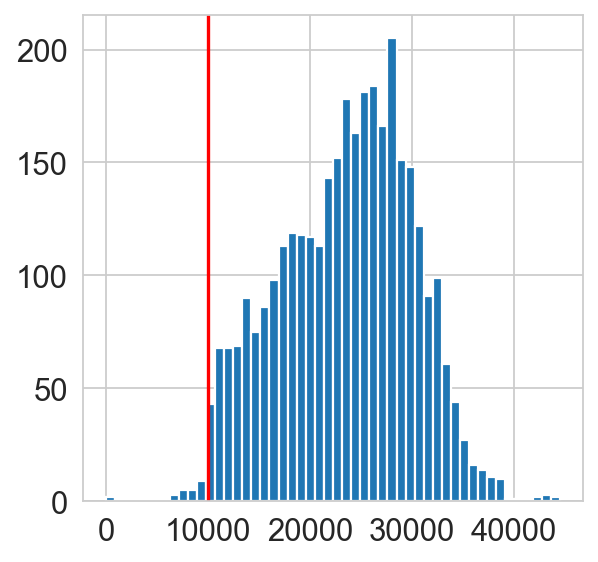

In [50]:
# number of peaks in a cell
plt.axvline(x=10000, color='r') # minimum number of feature covered per cells
np.histogram(adata.obs['coverage_cells'])
plt.hist(adata.obs['coverage_cells'], bins=50)
plt.show()

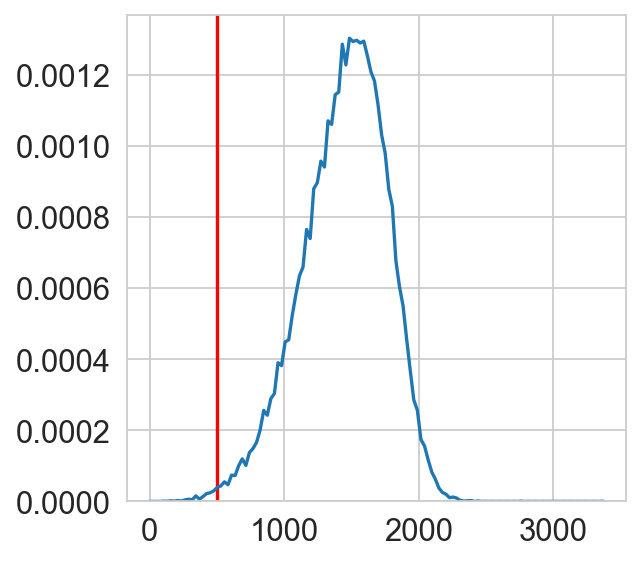

In [51]:
plt.axvline(x=500, color='r') # minimum number of cells covered to keep a feature
sns.set_style('whitegrid')
sns.kdeplot(np.array(adata.var['coverage_feature']), bw=0.5)

In [52]:
adata.obs

,cell_type,Library pool,Index i5,Index i7,i5 sequence,i7 sequence,random primer index,random primer index sequence,Total reads,Mapped reads,...,mCG/CG,mCH/CH,Estimated mCG/CG,Estimated mCH/CH,Neuron type,tSNE x coordinate,tSNE y coordinate\n,binary,coverage_cells,mean_cell_methylation
index,,,,,,,,,,,,,,,,,,,,,
allc_Pool_1000_AD002_indexed_qual30.tsv,mL5-1,K1K2,D508,D711,GTACTGAC,TCTCGCGC,AD002,CGATGT,3749296,1970400,...,1388,1138,148,1022,mL5-1,"-2,79539","-0,105851\n",inhibitory,21715,0.243341
allc_nuclei_600_S147_L006_qual30.tsv,mL5-1,N/A,D508,D712,GTACTGAC,AGCGATAG,AD012,CTTGTA,7069454,4358703,...,238,1174,23,1114,mL5-1,"-0,352829","0,932857\n",inhibitory,9976,0.110672
allc_nuclei_599_S146_L006_qual30.tsv,mL6-2,N/A,D507,D712,CAGGACGT,AGCGATAG,AD011,GGCTAC,18242158,11386231,...,1644,273,179,296,mL6-2,"10,0546","-9,78996\n",inhibitory,20162,0.216064
allc_nuclei_598_S145_L006_qual30.tsv,mL6-1,N/A,D506,D712,TAATCTTA,AGCGATAG,AD010,TAGCTT,7045252,4197889,...,2750,887,2765,0,mL6-1,"9,37005","2,71283\n",inhibitory,10374,0.148192
allc_nuclei_597_S144_L006_qual30.tsv,mL4,N/A,D505,D712,AGGCGAAG,AGCGATAG,AD008,ACTTGA,15116650,9483039,...,2213,702,238,70,mL4,"-4,17269","-2,94523\n",inhibitory,17226,0.199148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
allc_Pool_839_AD006_indexed_qual30.tsv,mPv,I1I2,D507,D712,CAGGACGT,AGCGATAG,AD006,GCCAAT,6760981,2875103,...,244,891,2264,821,mPv,"-0,198246","19,7879\n",inhibitory,28767,0.393699
allc_Pool_83_AD002_indexed_qual30.tsv,mL2/3,A1A2,D503,D711,CCTATCCT,TCTCGCGC,AD002,CGATGT,5254487,2706493,...,528,494,541,484,mL2/3,"-13,1049","0,642965\n",inhibitory,27409,0.275200
allc_Pool_83_AD006_indexed_qual30.tsv,mL4,A1A2,D503,D711,CCTATCCT,TCTCGCGC,AD006,GCCAAT,5332867,1913346,...,1060,228,1071,230,mL4,"-6,94662","-9,61211\n",inhibitory,26023,0.279163


In [53]:
adata

AnnData object with n_obs × n_vars = 3379 × 55017 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'coverage_cells', 'mean_cell_methylation'
    var: 'coverage_feature', 'mean_feature_methylation'
    uns: 'Estimated mCG', 'Estimated mCH', 'mCCC', 'mCG', 'mCH', 'omic'

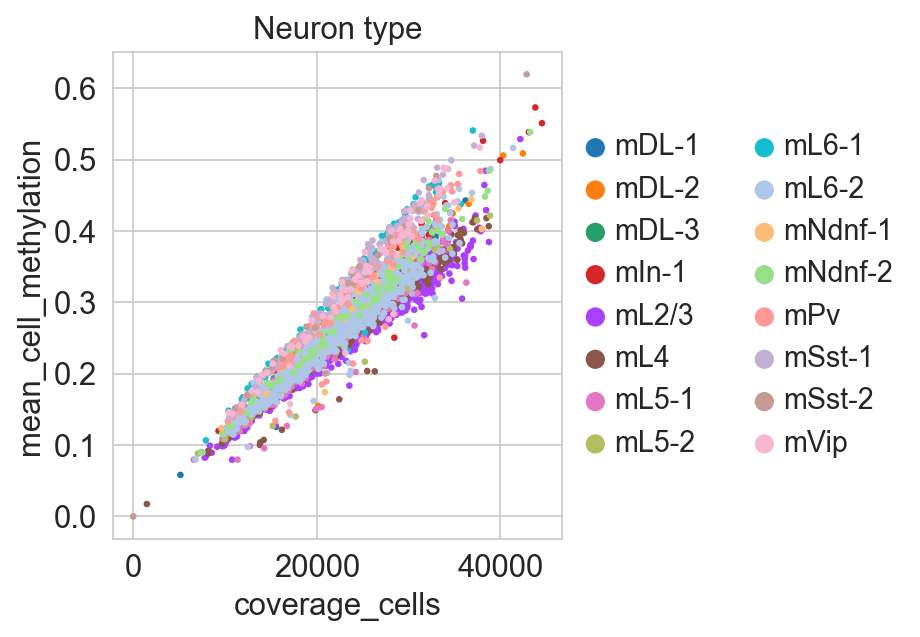

In [54]:
sc.pl.scatter(adata, 'coverage_cells', 'mean_cell_methylation', color='Neuron type')

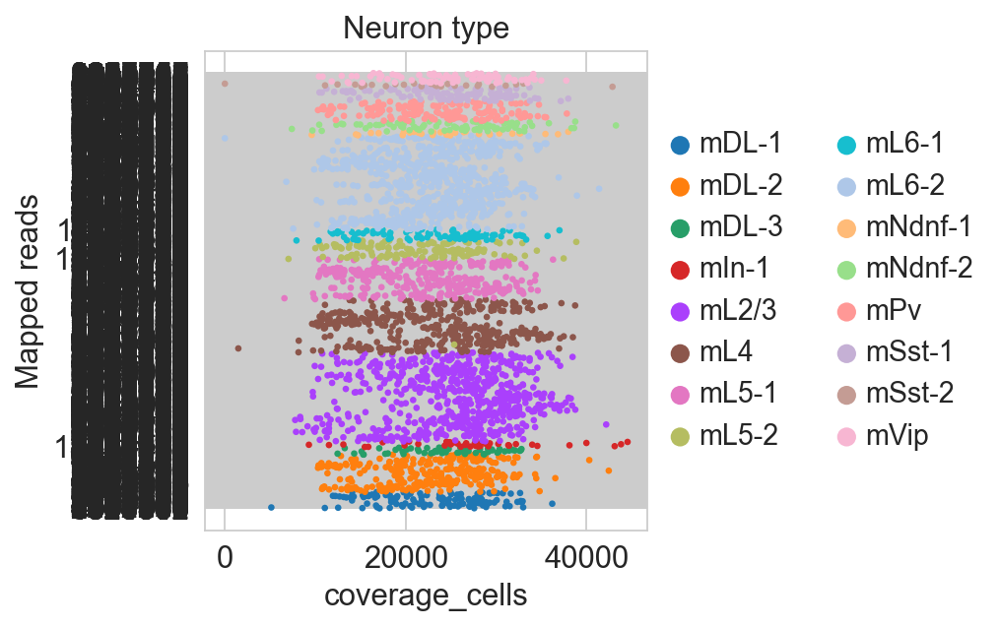

In [56]:
sc.pl.scatter(adata, 'coverage_cells', 'Mapped reads', color='Neuron type')

In [57]:
adata.obs['Mapped reads'] = [int(x) for x in adata.obs['Mapped reads']]

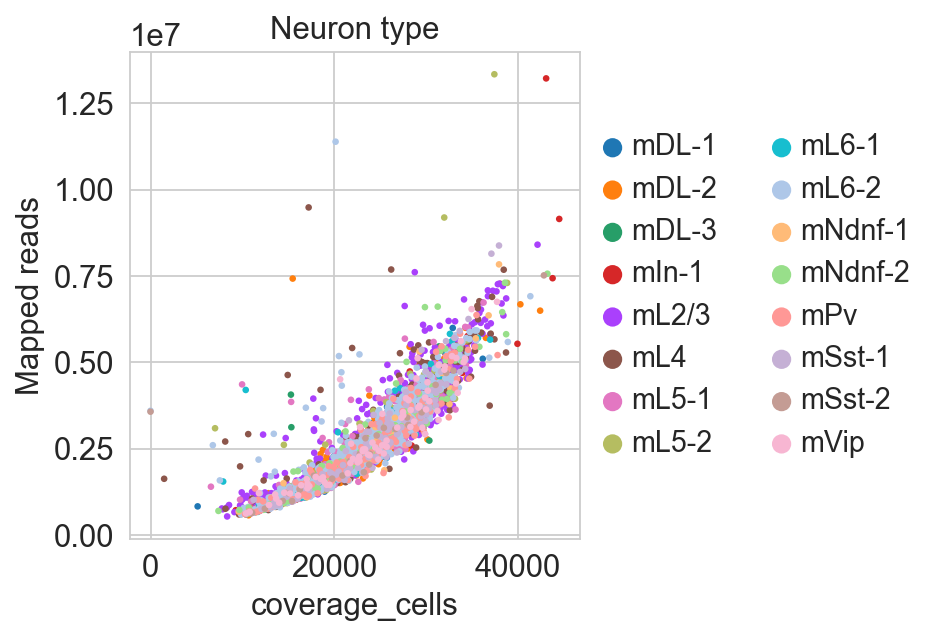

In [58]:
sc.pl.scatter(adata, 'coverage_cells', 'Mapped reads', color='Neuron type')

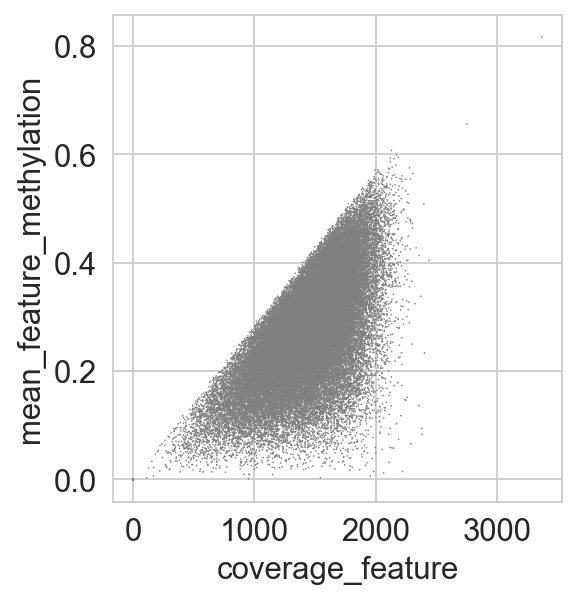

In [59]:
sc.pl.scatter(adata, 'coverage_feature', 'mean_feature_methylation')

In [60]:
#filter out cells with less than 10000 enhancers covered
adata=adata[adata.obs['coverage_cells']>10000,:].copy()
adata

AnnData object with n_obs × n_vars = 3346 × 55017 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'coverage_cells', 'mean_cell_methylation'
    var: 'coverage_feature', 'mean_feature_methylation'
    uns: 'Estimated mCG', 'Estimated mCH', 'mCCC', 'mCG', 'mCH', 'omic', 'Neuron type_colors'

### Imputation missing data

In [61]:
adata = epi.pp.imputation_met(adata, number_cell_covered=500, imputation_value='mean', save=None, copy=True)

In [62]:
adata

AnnData object with n_obs × n_vars = 3346 × 54710 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'coverage_cells', 'mean_cell_methylation'
    var: 'coverage_feature', 'mean_feature_methylation'
    uns: 'Estimated mCG', 'Estimated mCH', 'mCCC', 'mCG', 'mCH', 'omic', 'Neuron type_colors'

In [63]:
length1 = len(adata.X[0,:])
length2 = len(adata.X[:,0])
adata.obs['coverage_cells'] = [length1 - np.isnan(line).sum() for line in adata.X]
adata.obs['mean_cell_methylation'] = [np.nansum(line)/length1 for line in adata.X]
adata.var['coverage_feature'] = [length2 - np.isnan(line).sum() for line in adata.X.T]
adata.var['mean_feature_methylation'] = [np.nansum(line)/length2 for line in adata.X.T]

# Low dimensional representation

In [64]:
epi.pp.lazy(adata)

In [65]:
adata.write(OUT_DATADIR+'imputed_min500cells_min10000enhancers.h5ad')

In [66]:
adata

AnnData object with n_obs × n_vars = 3346 × 54710 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'coverage_cells', 'mean_cell_methylation'
    var: 'coverage_feature', 'mean_feature_methylation'
    uns: 'Estimated mCG', 'Estimated mCH', 'mCCC', 'mCG', 'mCH', 'omic', 'Neuron type_colors', 'pca', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

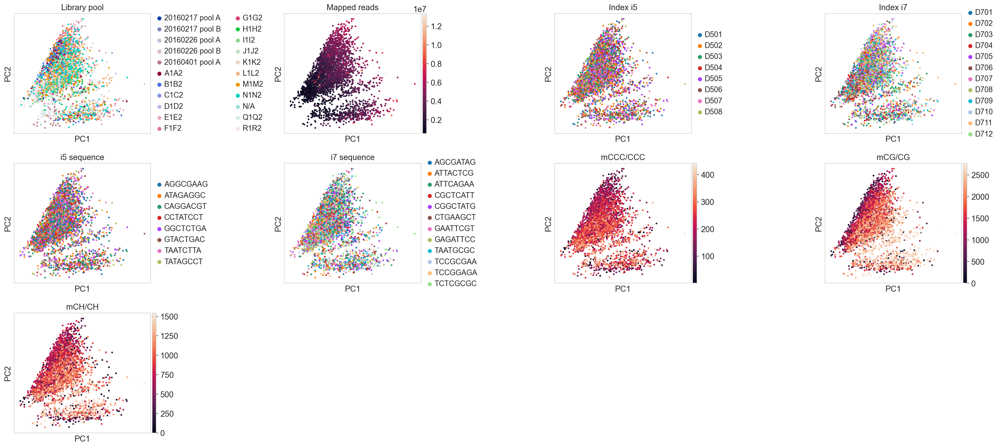

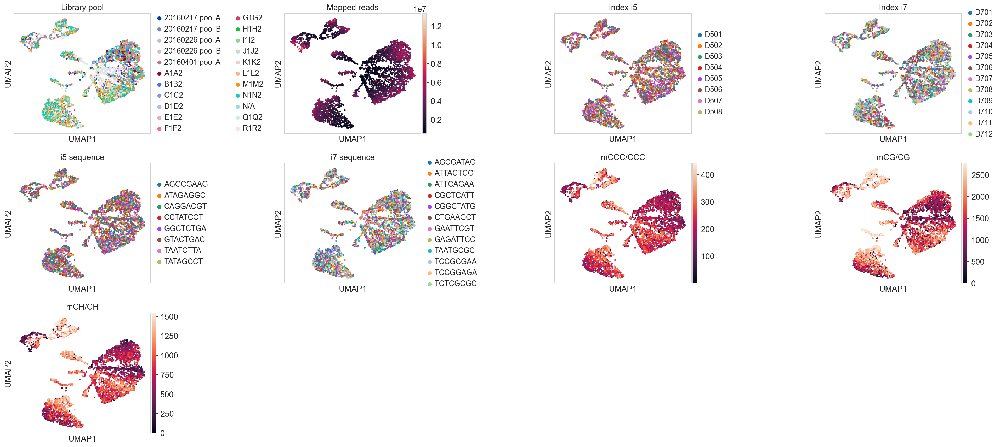

In [76]:
sc.pl.pca(adata, color=['Library pool', 'Mapped reads',
                         'Index i5', 'Index i7',
                         'i5 sequence', 'i7 sequence',
                         'mCCC/CCC', 'mCG/CG', 'mCH/CH',], wspace=0.8)
sc.pl.umap(adata, color=['Library pool', 'Mapped reads',
                         'Index i5', 'Index i7',
                         'i5 sequence', 'i7 sequence',
                         'mCCC/CCC', 'mCG/CG', 'mCH/CH'], wspace=0.8)

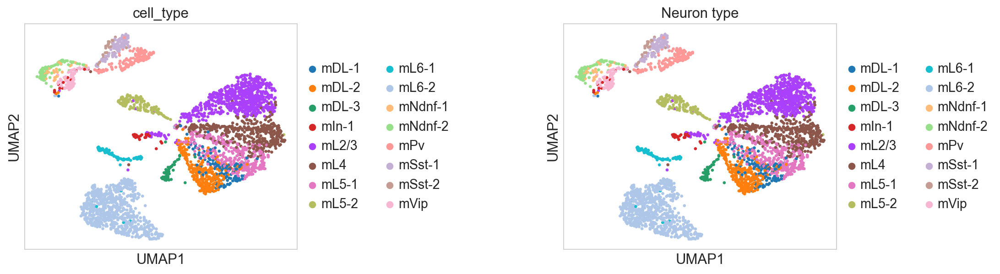

In [77]:
sc.pl.pca(adata, color=['cell_type', "Neuron type"], wspace=0.8)
sc.pl.umap(adata, color=['cell_type', "Neuron type"], wspace=0.8)

## Normalisation

In [79]:
sc.pp.regress_out(adata, 'Mapped reads')

In [80]:
epi.pp.lazy(adata)

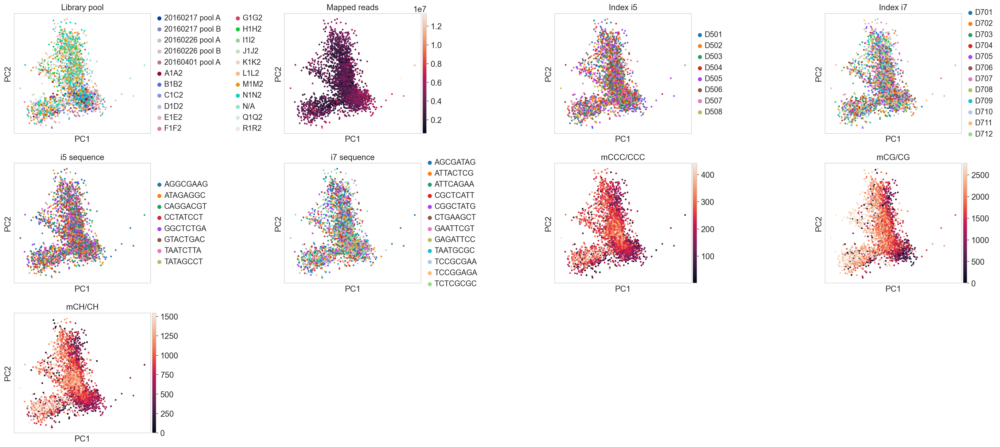

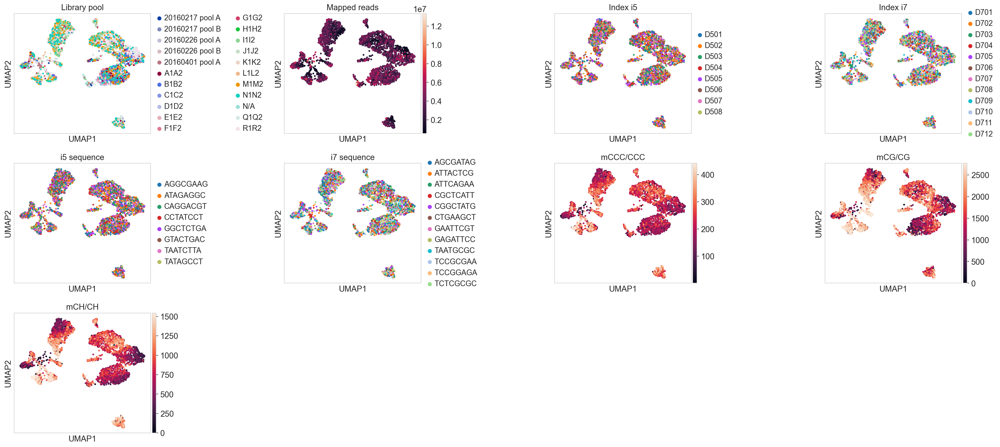

In [81]:
sc.pl.pca(adata, color=['Library pool', 'Mapped reads',
                         'Index i5', 'Index i7',
                         'i5 sequence', 'i7 sequence',
                         'mCCC/CCC', 'mCG/CG', 'mCH/CH',], wspace=0.8)
sc.pl.umap(adata, color=['Library pool', 'Mapped reads',
                         'Index i5', 'Index i7',
                         'i5 sequence', 'i7 sequence',
                         'mCCC/CCC', 'mCG/CG', 'mCH/CH'], wspace=0.8)

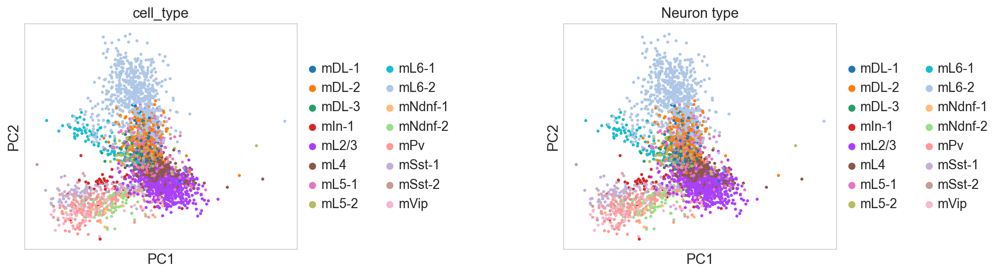

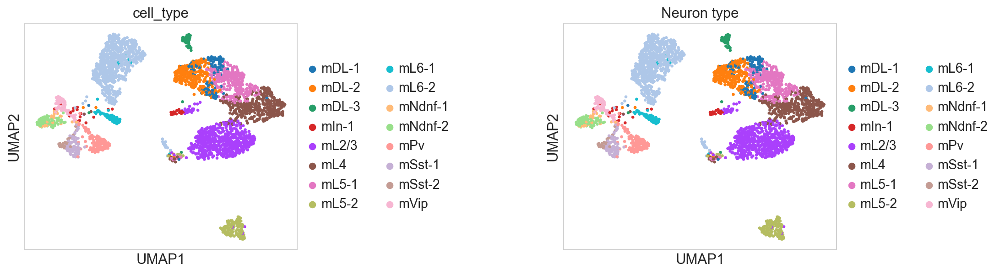

In [82]:
sc.pl.pca(adata, color=['cell_type', "Neuron type"], wspace=0.8)
sc.pl.umap(adata, color=['cell_type', "Neuron type"], wspace=0.8)

In [84]:
epi.tl.umap(adata, min_dist=1)

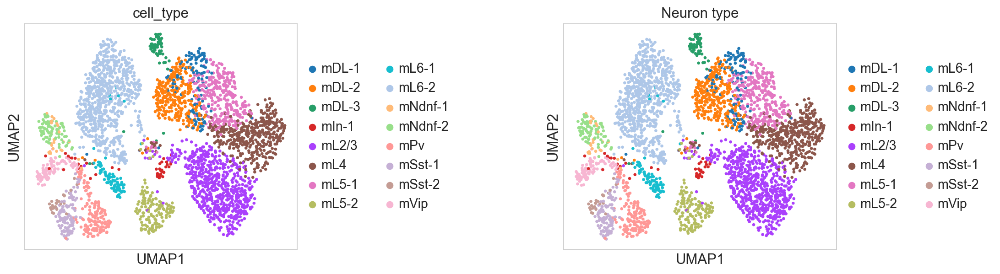

In [85]:
sc.pl.umap(adata, color=['cell_type', "Neuron type"], wspace=0.8)

In [86]:
adata.write(OUT_DATADIR+'imputed_min500cells_min10000enhancers_normalised.h5ad')